https://colab.research.google.com/github/Lucien-Piat/DEL_Single_Tree_Detection/blob/main/notebook.ipynb

In [1]:
import sys
sys.path.append("../")

import matplotlib.pyplot as plt
from IPython.display import clear_output
from src.data_pipeline import make_dataset

EPOCHS = 5
BATCH_SIZE = 32

In [2]:
train_dataset = make_dataset('../data/gold/train', batch_size=BATCH_SIZE)
valid_dataset = make_dataset('../data/gold/valid', batch_size=BATCH_SIZE)
test_dataset = make_dataset('../data/gold/test', batch_size=BATCH_SIZE)

---

In [3]:
import tensorflow as tf
from src.pix2pix import pix2pix

In [4]:
base_model = tf.keras.applications.MobileNetV2(input_shape=[128, 128, 3], include_top=False)

# Use the activations of these layers
layer_names = [
    'block_1_expand_relu',   # 64x64
    'block_3_expand_relu',   # 32x32
    'block_6_expand_relu',   # 16x16
    'block_13_expand_relu',  # 8x8
    'block_16_project',      # 4x4
]
base_model_outputs = [base_model.get_layer(name).output for name in layer_names]

# Create the feature extraction model
down_stack = tf.keras.Model(inputs=base_model.input, outputs=base_model_outputs)

down_stack.trainable = False

In [5]:
up_stack = [
    pix2pix.upsample(512, 3),  # 4x4 -> 8x8
    pix2pix.upsample(256, 3),  # 8x8 -> 16x16
    pix2pix.upsample(128, 3),  # 16x16 -> 32x32
    pix2pix.upsample(64, 3),   # 32x32 -> 64x64
]

In [6]:
def unet_model(output_channels:int = 1):
    inputs = tf.keras.layers.Input(shape=[128, 128, 3])

    # Downsampling through the model
    skips = down_stack(inputs)
    x = skips[-1]
    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        concat = tf.keras.layers.Concatenate()
        x = concat([x, skip])

    # This is the last layer of the model
    last = tf.keras.layers.Conv2DTranspose(
        filters=output_channels, kernel_size=3, strides=2,
        padding='same')  #64x64 -> 128x128

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)

In [7]:
@tf.keras.utils.register_keras_serializable()
def mean_iou(y_true, y_pred):
    batch_size = tf.shape(y_true)[0]

    # Flatten
    y_true = tf.reshape(y_true, [batch_size, -1])
    y_pred = tf.reshape(y_pred, [batch_size, -1]) # logits
    y_pred = tf.cast(y_pred >= 0, tf.float32)     # classes (0 or 1)

    # Intersection
    intersection = tf.reduce_sum(y_true * y_pred, axis=1)

    # Union
    union = tf.reduce_sum(y_true, axis=1) + tf.reduce_sum(y_pred, axis=1) - intersection

    # handle the case where the denominator is 0
    intersection = tf.where(union > 0, intersection, 0)
    union = tf.where(union > 0, union, 1)

    return tf.reduce_mean(intersection / union)

In [8]:
model = unet_model()
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
    metrics=[
        'accuracy',
        mean_iou
    ]
)

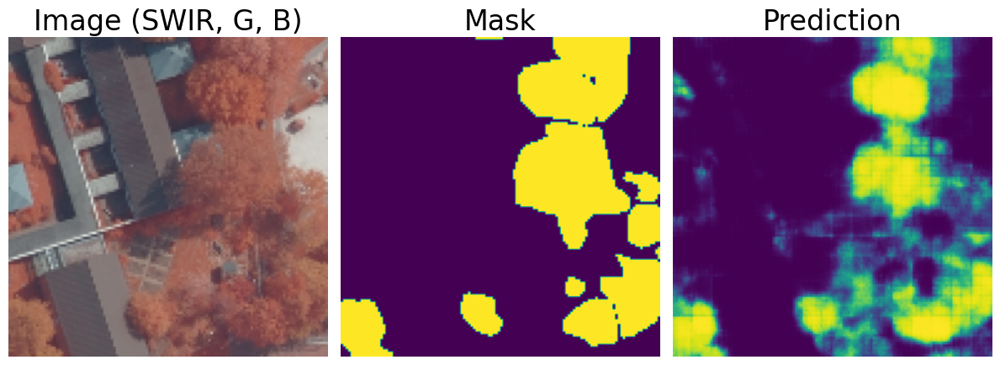

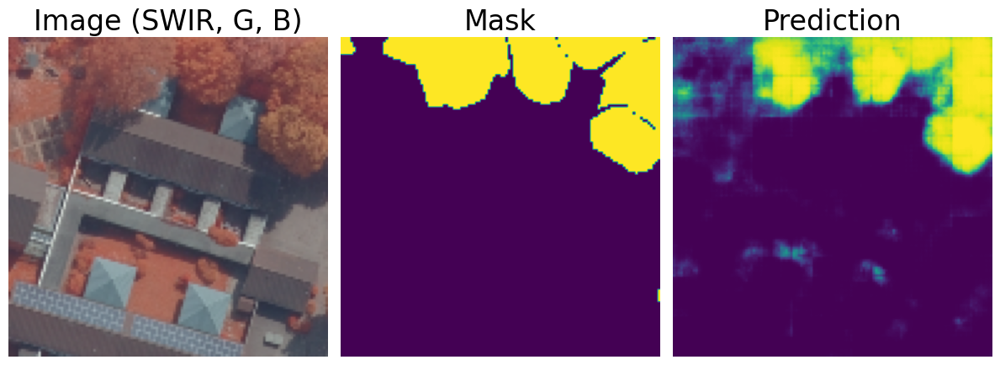

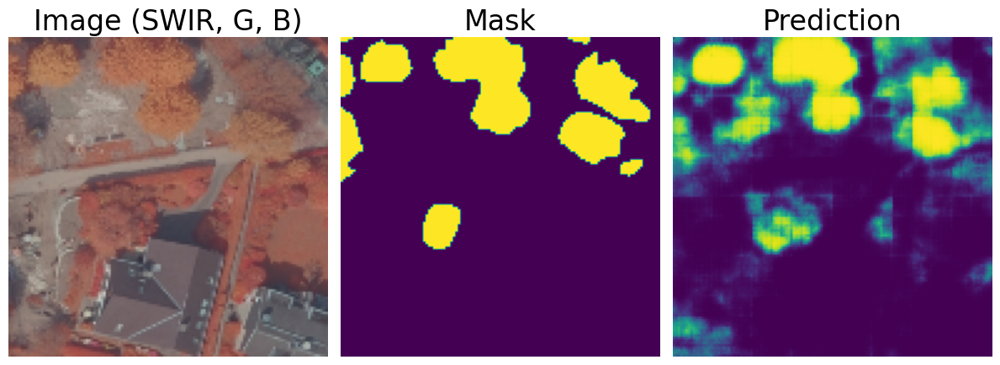

2024-04-30 23:01:50.827233: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [48]:
import matplotlib.pyplot as plt 

def show_predictions(n = 3, dataset=valid_dataset):
    for idx, [image, mask] in enumerate(dataset.take(n)):
        pred_mask_logits = model.predict(image, verbose=0)
        pred_mask = tf.sigmoid(pred_mask_logits)
        plt.figure(figsize=(12, 4.5))
        plt.subplot(1, 3, 1)
        plt.imshow(image[0])
        plt.title('Image (SWIR, G, B)', fontsize=24)
        plt.axis('off')
        plt.subplot(1, 3, 2)
        plt.imshow(mask[0])
        plt.title('Mask', fontsize=24)
        plt.axis('off')
        plt.subplot(1, 3, 3)
        plt.imshow(pred_mask[0, :, :, 0])
        plt.title('Prediction', fontsize=24)
        plt.axis('off')
        plt.tight_layout()
        plt.savefig('reports/output:{}.png'.format(idx))
        plt.show()  

class DisplayCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        print('\nSample Prediction after epoch {}\n'.format(epoch+1))
        show_predictions()

show_predictions(n=3)

Epoch 1/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 892ms/step - accuracy: 0.7459 - loss: 0.4725 - mean_iou: 0.3710
Sample Prediction after epoch 1



2024-04-30 19:02:36.960318: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


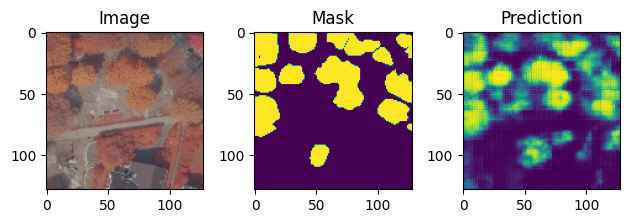

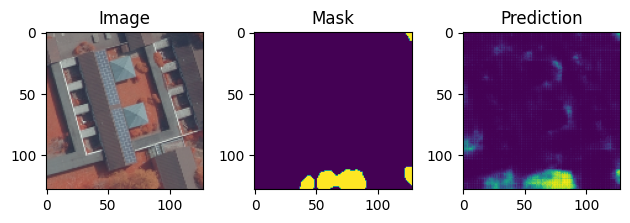

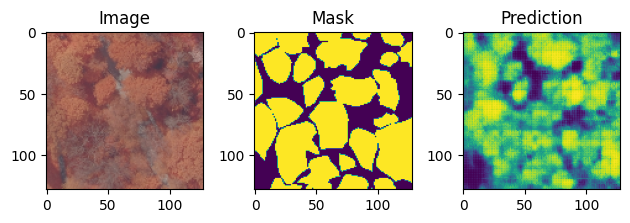

100/100 ━━━━━━━━━━━━━━━━━━━━ 153s 1s/step - accuracy: 0.7467 - loss: 0.4713 - mean_iou: 0.3723 - val_accuracy: 0.8671 - val_loss: 0.2704 - val_mean_iou: 0.5925
Epoch 2/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 936ms/step - accuracy: 0.8897 - loss: 0.2378 - mean_iou: 0.6462
Sample Prediction after epoch 2



2024-04-30 19:05:08.507999: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


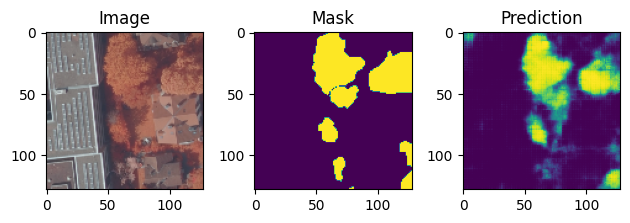

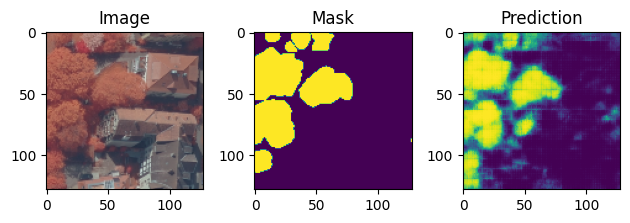

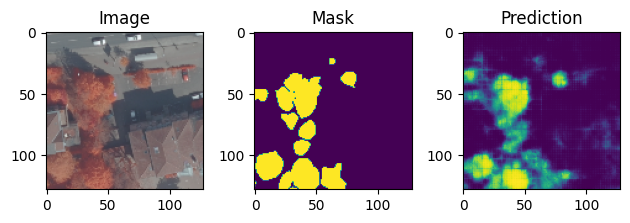

100/100 ━━━━━━━━━━━━━━━━━━━━ 152s 2s/step - accuracy: 0.8897 - loss: 0.2377 - mean_iou: 0.6463 - val_accuracy: 0.8851 - val_loss: 0.2538 - val_mean_iou: 0.6411
Epoch 3/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 936ms/step - accuracy: 0.9011 - loss: 0.2151 - mean_iou: 0.6767
Sample Prediction after epoch 3



2024-04-30 19:07:40.891488: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


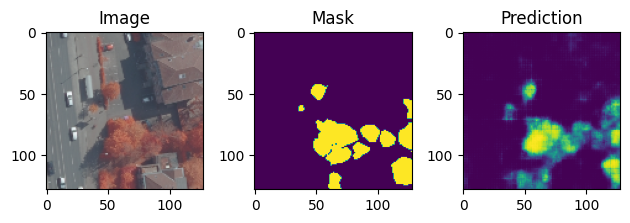

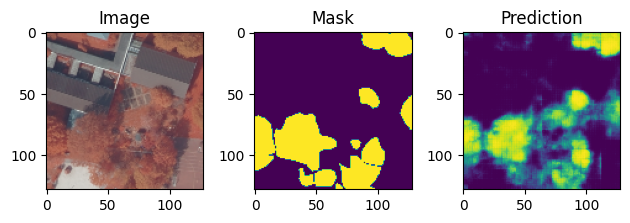

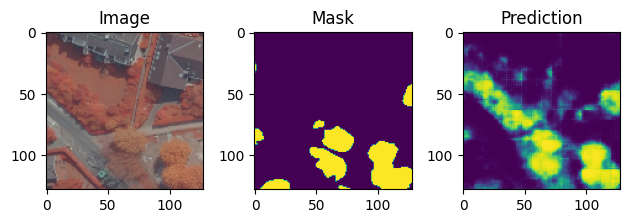

100/100 ━━━━━━━━━━━━━━━━━━━━ 152s 2s/step - accuracy: 0.9011 - loss: 0.2151 - mean_iou: 0.6767 - val_accuracy: 0.8852 - val_loss: 0.2418 - val_mean_iou: 0.6473
Epoch 4/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 978ms/step - accuracy: 0.9080 - loss: 0.2013 - mean_iou: 0.6996
Sample Prediction after epoch 4



2024-04-30 19:10:27.021819: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


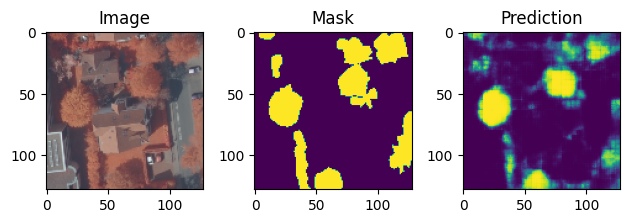

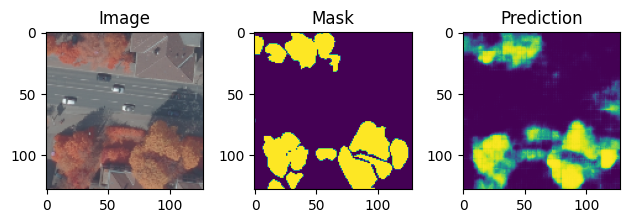

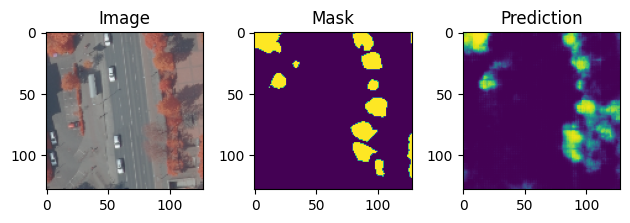

100/100 ━━━━━━━━━━━━━━━━━━━━ 166s 2s/step - accuracy: 0.9080 - loss: 0.2012 - mean_iou: 0.6996 - val_accuracy: 0.8934 - val_loss: 0.2329 - val_mean_iou: 0.6656
Epoch 5/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9139 - loss: 0.1892 - mean_iou: 0.7164
Sample Prediction after epoch 5



2024-04-30 19:13:40.977422: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


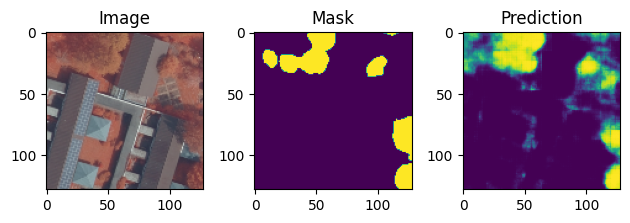

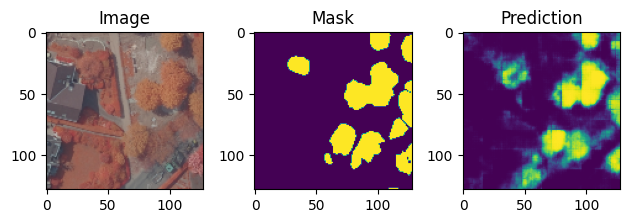

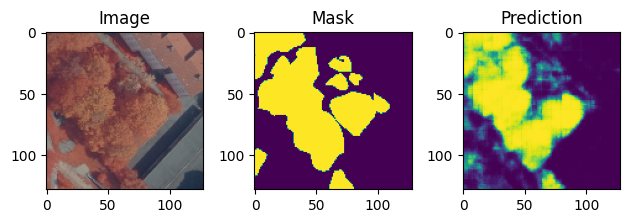

100/100 ━━━━━━━━━━━━━━━━━━━━ 194s 2s/step - accuracy: 0.9139 - loss: 0.1892 - mean_iou: 0.7164 - val_accuracy: 0.8889 - val_loss: 0.2344 - val_mean_iou: 0.6494


In [10]:
train_steps = 100
valid_steps = 100

model_history = model.fit(
    train_dataset,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    steps_per_epoch=train_steps,
    validation_steps=valid_steps,
    validation_data=valid_dataset,
    callbacks=[DisplayCallback()]
)

In [19]:
# save a copy of model_history object
import pickle
import os

if not os.path.exists('models'):
    os.makedirs('models')

with open('models/model_history.pkl', 'wb') as f:
    pickle.dump(model_history.history, f)

model.save('models/u_net.keras')

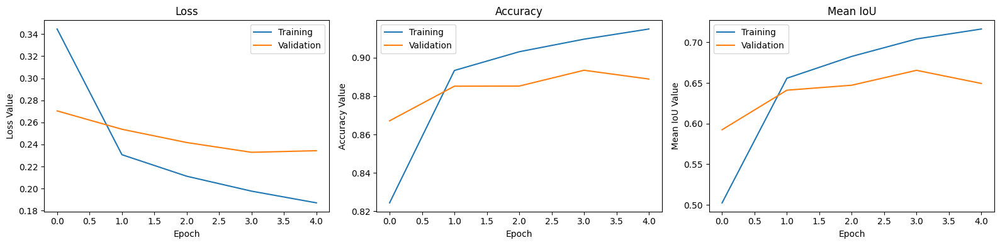

In [12]:
plt.figure(figsize=(16, 4))

x = model_history.epoch
loss = model_history.history['loss']
val_loss = model_history.history['val_loss']

plt.subplot(1, 3, 1)
plt.plot(x, loss, label='Training')
plt.plot(x, val_loss, label='Validation')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
plt.title('Loss')
plt.legend()

acc = model_history.history['accuracy']
val_acc = model_history.history['val_accuracy']

plt.subplot(1, 3, 2)
plt.plot(x, acc, label='Training')
plt.plot(x, val_acc, label='Validation')
plt.xlabel('Epoch')
plt.ylabel('Accuracy Value')
plt.title('Accuracy')
plt.legend()


iou = model_history.history['mean_iou']
val_iou = model_history.history['val_mean_iou']

plt.subplot(1, 3, 3)
plt.plot(x, iou, label='Training')
plt.plot(x, val_iou, label='Validation')
plt.xlabel('Epoch')
plt.ylabel('Mean IoU Value')
plt.title('Mean IoU')
plt.legend()

# save
plt.tight_layout()
plt.savefig('models/metrics.pdf')

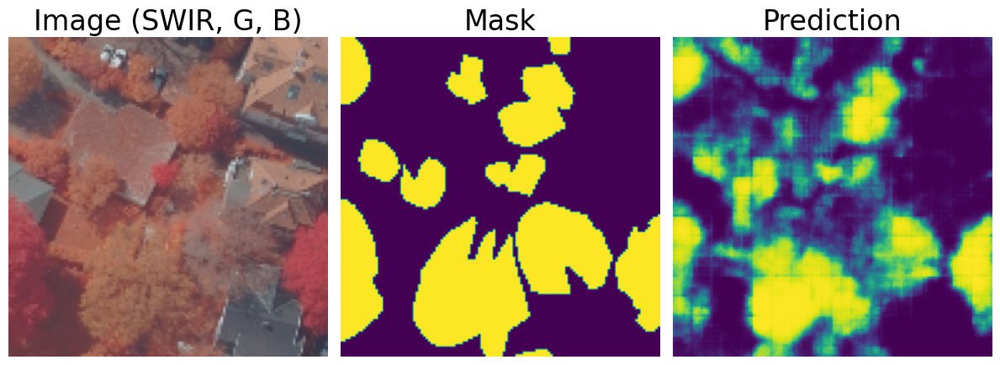

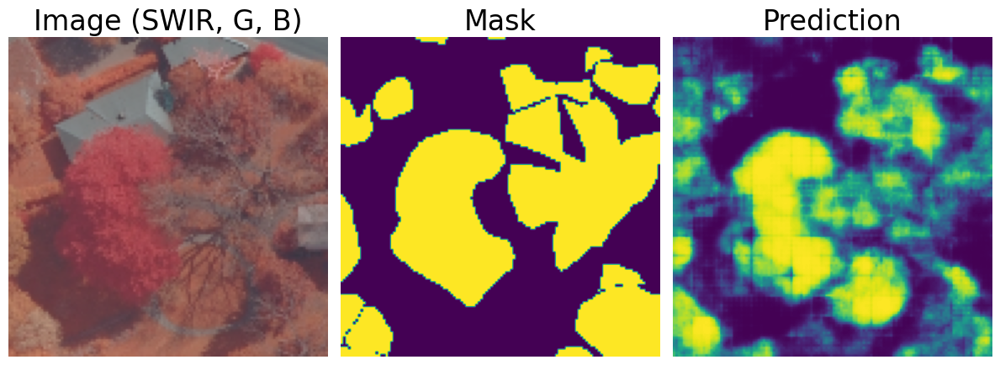

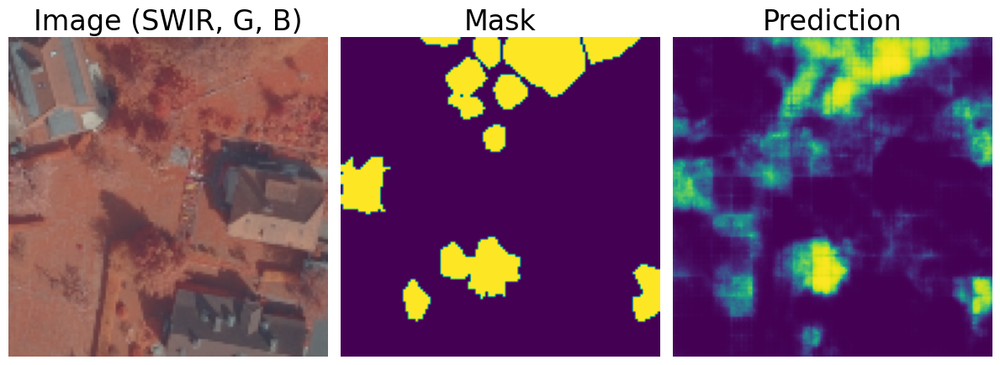

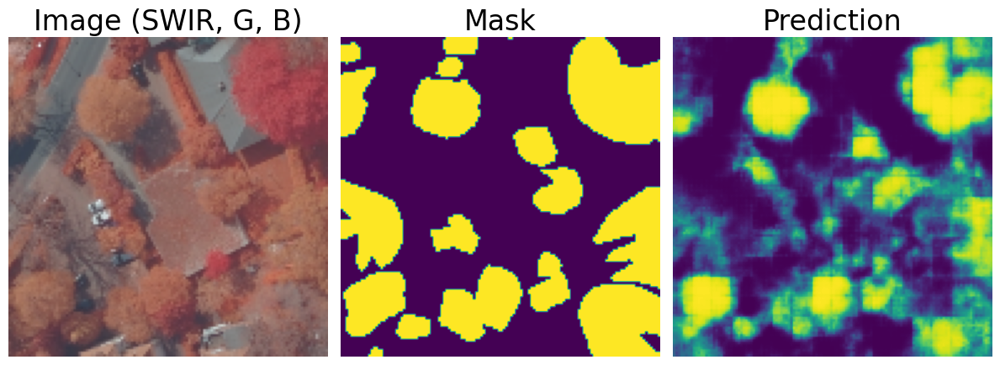

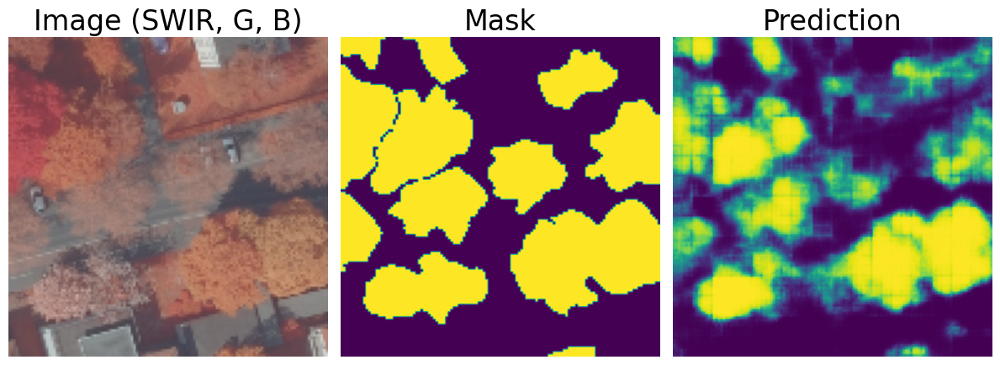

...

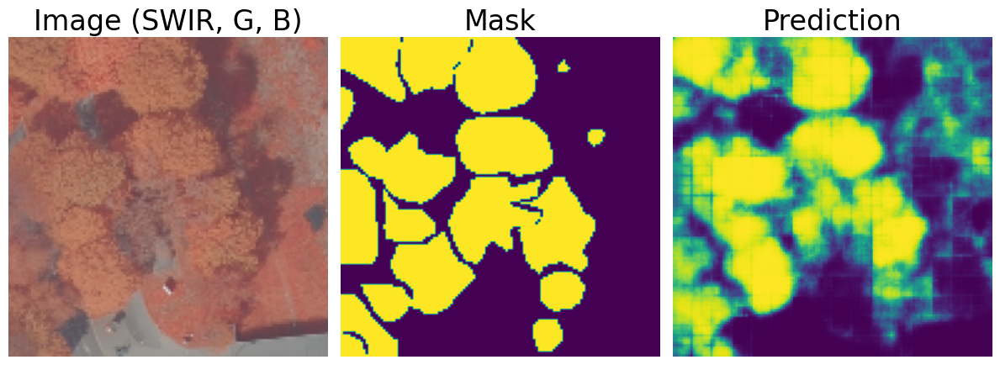

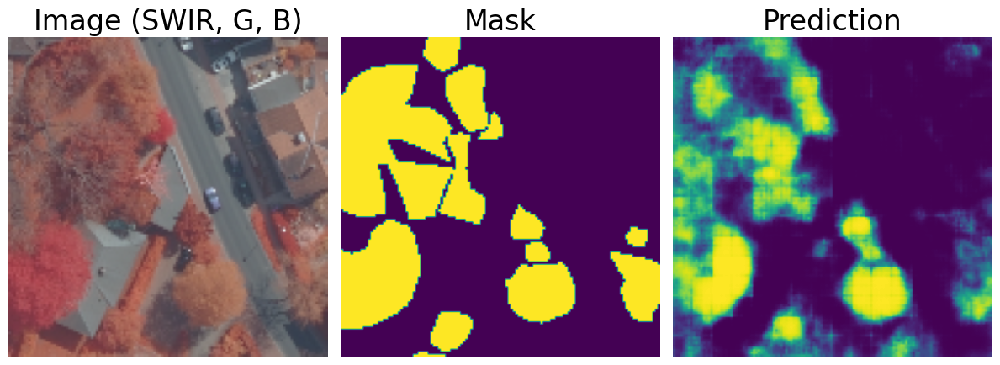

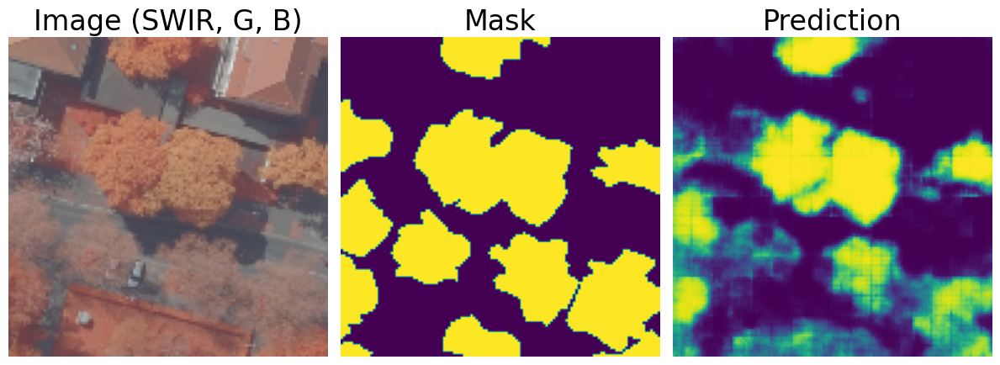

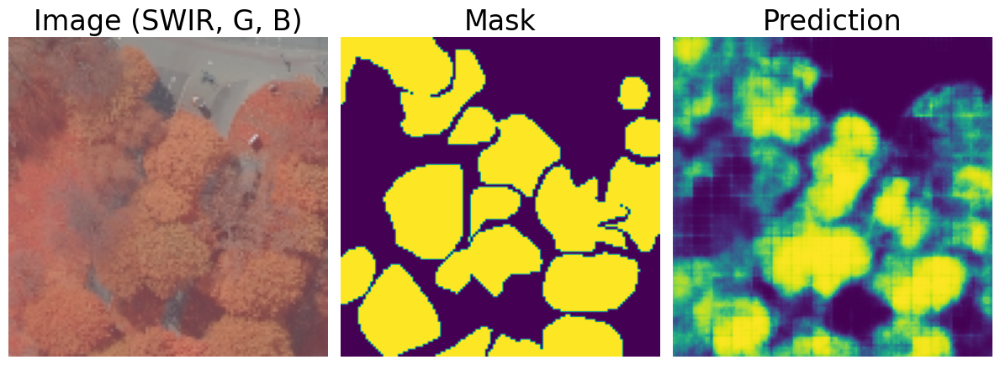

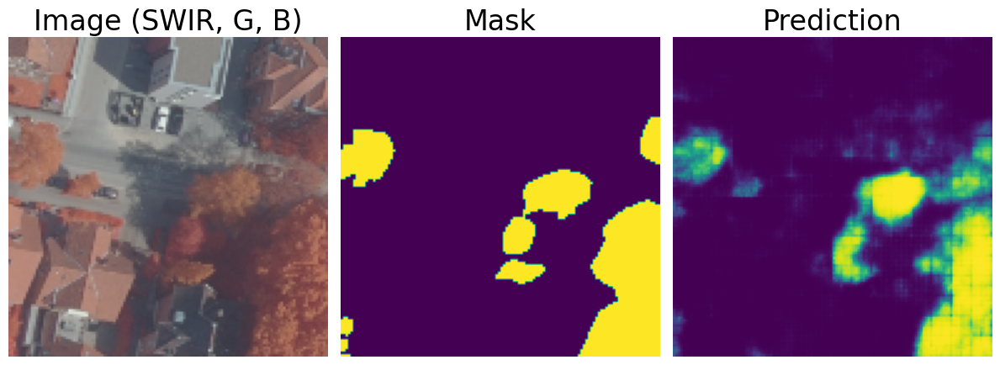

2024-04-30 23:02:34.312853: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [49]:
show_predictions(n=20, dataset=test_dataset)

In [30]:
model = tf.keras.models.load_model('models/u_net.keras', custom_objects={'mean_iou': mean_iou})

/Users/nomomon/Desktop/Uni/DLF-Single-Tree-Detection/.venv/lib/python3.12/site-packages/keras/src/saving/saving_lib.py:418: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 16 variables whereas the saved optimizer has 30 variables. 
  trackable.load_own_variables(weights_store.get(inner_path))


2024-04-30 21:10:22.669962: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


tf.Tensor(0.6442593, shape=(), dtype=float32)


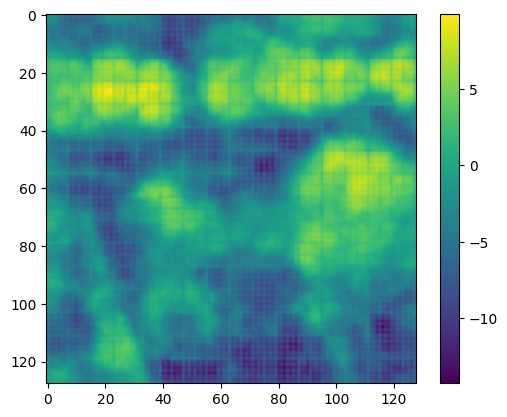

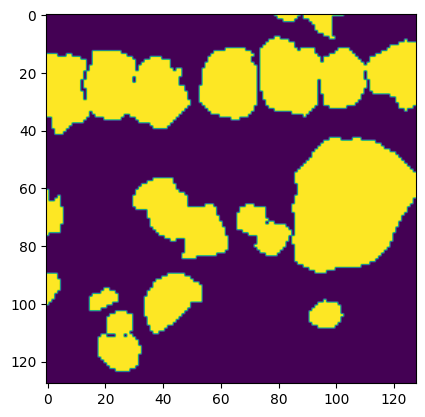

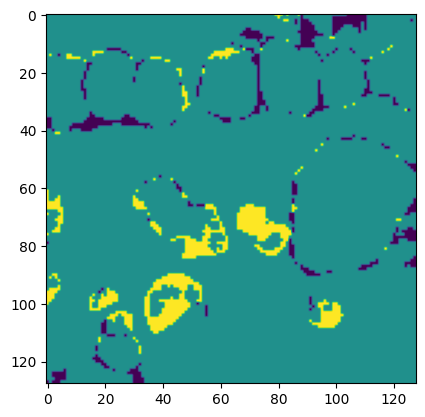

In [32]:
for image, mask in list(test_dataset.take(1)):
    pred_mask_logits = model.predict(image, verbose=0)

    mean_iou_score = mean_iou(mask, pred_mask_logits)

    print(mean_iou_score)

threshold = 0
thresholded_mask = tf.cast(pred_mask_logits >= threshold, tf.float32)

plt.imshow(pred_mask_logits[0, :, :, 0])
plt.colorbar()
plt.show()
plt.imshow(mask[0])
plt.show()
# difference between the two masks
plt.imshow(mask[0] - thresholded_mask[0, :, :, 0])

In [26]:
import pandas as pd 

steps = 100

df = pd.DataFrame([
    model.evaluate(test_dataset, steps=steps),
    model.evaluate(train_dataset, steps=steps),
    model.evaluate(valid_dataset, steps=steps)
],
    columns=['Loss', 'Accuracy', 'Mean IoU'],
    index=['Train', 'Validation', 'Test']
).T

df

100/100 ━━━━━━━━━━━━━━━━━━━━ 54s 533ms/step - accuracy: 0.8706 - loss: 0.2811 - mean_iou: 0.6521
100/100 ━━━━━━━━━━━━━━━━━━━━ 61s 599ms/step - accuracy: 0.9121 - loss: 0.1848 - mean_iou: 0.7114
100/100 ━━━━━━━━━━━━━━━━━━━━ 56s 556ms/step - accuracy: 0.8893 - loss: 0.2333 - mean_iou: 0.6515


,Train,Validation,Test
Loss,0.280784,0.184565,0.232987
Accuracy,0.870543,0.912160,0.889653
Mean IoU,0.649922,0.712121,0.649626


In [27]:
df.to_latex('models/metrics.tex')